# **1. Image Folder Review & Cleaning**

In [1]:
# Done

# **2. Imports**

In [2]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import matplotlib.image as mpimg
from matplotlib import pyplot
import seaborn as sns 
from PIL import Image
from glob import glob
import os 
import random  
import cv2 

import torch
import torchvision

# **3. Settings**

Notebook Color Scheme:


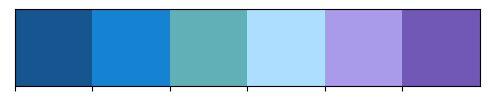

In [3]:
import matplotlib as mpl
# Custom colors
class color:
    S = '\033[1m' + '\033[94m'
    E = '\033[0m'
# Set Matplotlib graph colors
my_colors = ["#16558F", "#1583D2", "#61B0B7", "#ADDEFF", "#A99AEA", "#7158B7"]
print(color.S+"Notebook Color Scheme:"+color.E)
sns.palplot(sns.color_palette(my_colors))
plt.show() 
# Set Matplotlib graph settings
sns.set_style("white")
mpl.rcParams['xtick.labelsize'] = 14
mpl.rcParams['ytick.labelsize'] = 14
mpl.rcParams['axes.spines.left'] = False
mpl.rcParams['axes.spines.right'] = False
mpl.rcParams['axes.spines.top'] = False
plt.rcParams.update({'font.size': 14})

# **4. Data Exploration**

In [4]:
dir1 = 'TMMT Old Discwheel Datasets'

In [5]:
classes = set(os.listdir(dir1))
classes_labels = {subdir:i for i,subdir in enumerate(classes)}
print(f"Number of classes: {len(classes)}")
print(classes)

Number of classes: 9
{'BUMERANK', '5K SIYTAS', 'SAR', 'PS 5 KOL', 'PS Y KOL', 'PS 10 KOL', '20KOL PAR', '10K YILDIZ', '20KOL FUME'}


In [6]:
from glob import glob
import os
def return_dups(*dirs):
    directories = [*dirs]
    images = sum([glob(os.path.join(i,j), recursive=True) for j in ("**/*.png","**/*.jpg","**/*.jpeg","**/*.bmp") for i in directories],[])
    return len(images) - len(set(images))
    # return set([x for x in images if images.count(x) > 1]) # Uncomment this line to see duplicated images

return_dups(dir1)

0

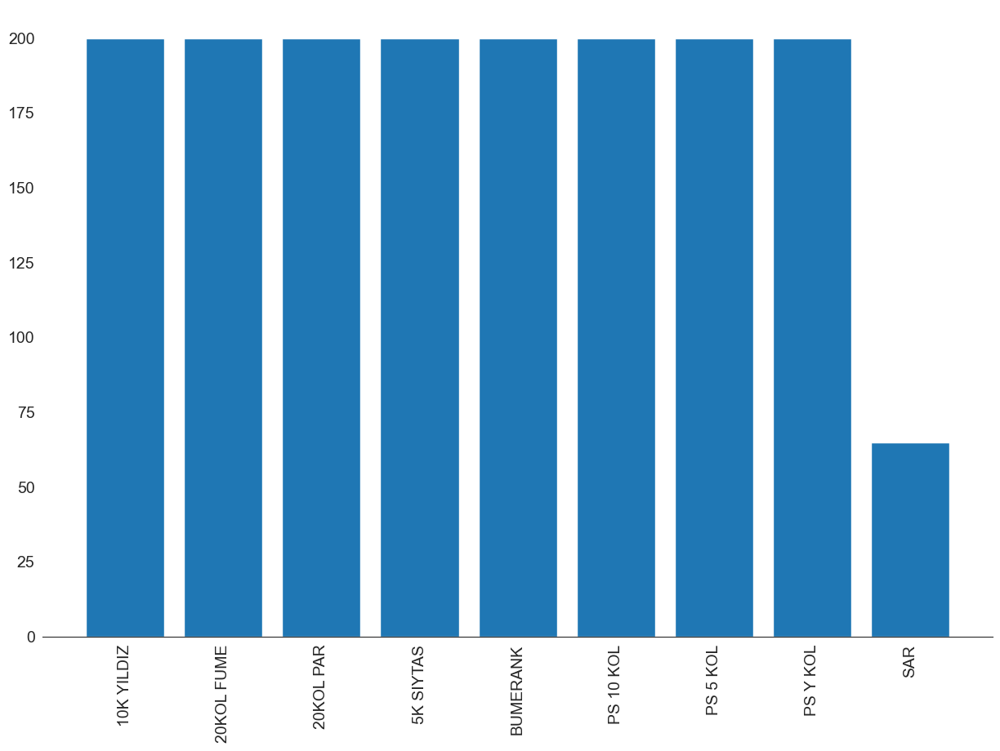

In [7]:
def plot_class_dist(*dir):
    directories = [*dir]
    model_classes = {}
    for directory in directories:
        for classes in os.listdir(directory):
            model_classes[classes]=0
    for directory in directories:
        for classes in os.listdir(directory):
            model_classes[classes]+=len(os.listdir(os.path.join(directory,classes)))
    
    plt.figure(figsize=(15,10))
    plt.bar(*zip(*model_classes.items()))
    var = plt.xticks(rotation=90) # Optional: If you have too much data, rotates labels
    plt.show()

plot_class_dist(dir1)

In [8]:
def plot_summary_graphs(*dir, num_samples=500):
    graph_list = {"Width/Height Ratio":[],"Format":[],"Width":[],"Height":[]}
    directories = [*dir]
    images = sum([glob(os.path.join(i,j), recursive=True) for j in ("**/*.png","**/*.jpg","**/*.jpeg","**/*.bmp") for i in directories],[])
    all_files = sum([glob(os.path.join(i,'**/*.*'), recursive=True) for i in directories],[])
    graph_list["Format"] = [fp.split('.')[-1] for fp in all_files]
    print('Total Number of images: %d'%len(images))
    samples = images if num_samples==0 else random.sample(images, num_samples)
    for image in samples:
        im = Image.open(image)
        graph_list["Width"].append(im.size[0])
        graph_list["Height"].append(im.size[1])
        graph_list["Width/Height Ratio"].append(im.size[0]/im.size[1])
    plt.figure(figsize=(15,10))
    for i,k in enumerate(graph_list):
        plt.subplot(2, 2, i+1)
        # ax = sns.countplot(x=graph_list[k])
        # ax.bar_label(ax.containers[0])
        counts, edges, bars = plt.hist(graph_list[k], align="mid")
        plt.bar_label(bars)
        # plt.hist(graph_list[k], histtype='stepfilled', align='mid')
        plt.title('Distribution of '+ k)
    plt.tight_layout()
    plt.ticklabel_format(useOffset=False) # Prevents scientific notation (e.g 1.28e3) 
    plt.show()

# set num_samples to 0 to check all dir
# plot_summary_graphs(dir1, num_samples=900)

In [9]:
def plot_images_dirs(*dir, num_samples=5, num_cols=5, plot_gap=6):     
    directories = [*dir]
    images = sum([glob(os.path.join(i,j), recursive=True) for j in ("**/*.png","**/*.jpg","**/*.jpeg","**/*.bmp") for i in directories],[])
    samples = images if num_samples==0 else random.sample(images, num_samples)
    fig = plt.figure(figsize=(20,num_samples/num_cols*plot_gap))
    for i,image in enumerate(samples):
        plt.subplot(round(num_samples/num_cols),num_cols,i+1)
        img = Image.open(image)
        plt.title("Dataset: " + image.split("\\")[-2] + "\n" + str(img.size))
        plt.imshow(img)
    plt.tight_layout() 
    plt.show()

# plot_images_dirs(dir1, num_samples=21, num_cols=3, plot_gap=6)

In [10]:
batch_size = 32
seed = 10
img_size = (224,224) # (width, height) - This will be the dimensions to load images!!!

# **5. Loading Data**

In [11]:
def fp_to_df(f_path):
    labels = []
    filepaths = []

    for folder in os.listdir(f_path):
        for image in os.listdir(os.path.join(f_path,folder)):
            labels.append(folder)
            filepaths.append(os.path.join(f_path,folder,image))

    filepath = pd.Series(filepaths, name="Filepath")
    label = pd.Series(labels, name="Label")

    df = pd.concat([label,filepath], axis=1)

    return df

df = fp_to_df(dir1)

# **6. Merging & Shuffling Seperate Sets**

In [12]:
# Already done

# **7. Data Cleaning & Feature Engineering**

In [13]:
df.isna().any()

Label       False
Filepath    False
dtype: bool

# **8. Exploratory Data Analysis**

In [14]:
df.describe()

,Label,Filepath
count,1665,1665
unique,9,1665
top,10K YILDIZ,TMMT Old Discwheel Datasets\10K YILDIZ\40058_S...
freq,200,1


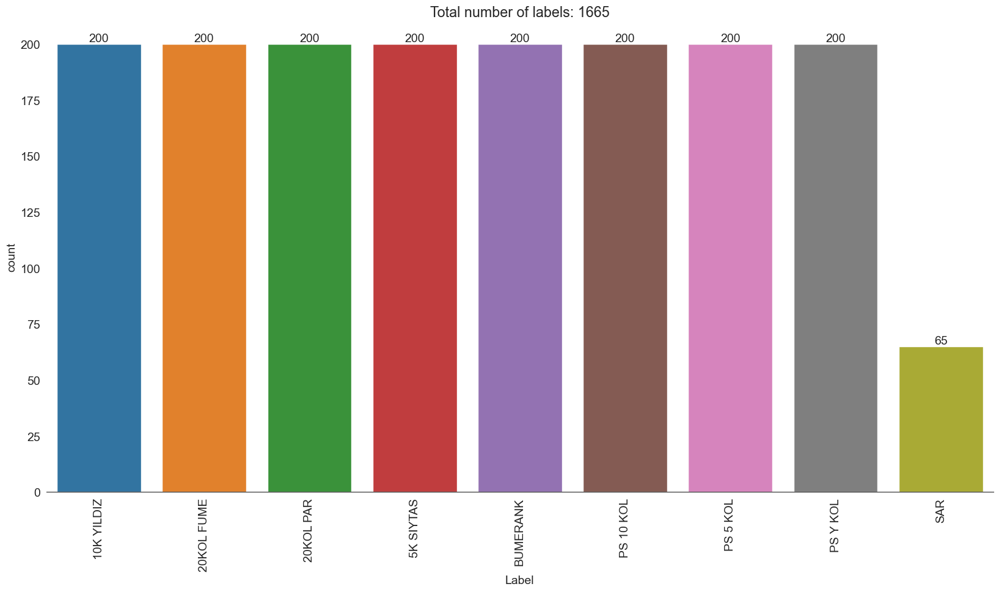

In [15]:
def plot_class_dist(*class_labels):  
    """
    Plot class distribution
    class_labels: list or series of class labels
    """
    fig = plt.figure(figsize=(20, 10))
    gs = fig.add_gridspec(len(class_labels),1) # Create subplots & specify (#rows, #columns)
    gs.update(wspace=0.2, hspace=0.2) # Specify spaces between subplot (#rows, #columns)
    for i in range(len(class_labels)):
        ax = fig.add_subplot(gs[i, 0]) # Place plot on a subplot [row,column]
        ax = sns.countplot(x=class_labels[i]) # For Array, use x=y, to change orientation: "x=" → "y="
        ax.bar_label(ax.containers[0]) # Show number on top of bars
        ax.title.set_text(f"Total number of labels: {len(class_labels[i])}")
        dummy = ax.set_xticklabels(ax.get_xticklabels(), rotation=90) #If you have too much class, rotates x labels

plot_class_dist(df['Label'])

# **9. Image Processing**

In [16]:
# Not required at this point, might do if accuracy is low

# **10. Target / Label Formatting**

In [17]:
classes = sorted(np.unique(df["Label"], return_counts=True)[0].tolist()) # For Array; df["label"] → y
print(classes)

['10K YILDIZ', '20KOL FUME', '20KOL PAR', '5K SIYTAS', 'BUMERANK', 'PS 10 KOL', 'PS 5 KOL', 'PS Y KOL', 'SAR']


In [18]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
le.fit(classes)
df['Label'] = le.transform(df["Label"].values)

# **11. Create Dataset Class For Pytorch CNN**

In [19]:
class CNN_Dataset(torch.utils.data.Dataset):
    def __init__(self, im_paths, labels, im_size=None, transform=None):
        super().__init__()  # Call the parent class constructor
        self.im_paths = [path for path in im_paths]
        self.labels = [label for label in labels]
        self.classes = list(set(item for item in labels))
        self.labels_dict = {c: i for i, c in enumerate(self.classes)}
        self.im_size = im_size
        self.transform = transform

    def __len__(self):
        return len(self.im_paths)

    def __getitem__(self, index):
        label = self.labels_dict[self.labels[index]]
        img = Image.open(self.im_paths[index]).convert("RGB")
        if self.im_size: img = img.resize(self.im_size)
        img = np.array(img, dtype=np.float32) / 255.0
        
        if self.transform:
            aug = self.transform(image = img)
            img = aug['image']
        
        return torchvision.transforms.ToTensor()(img), label

# **12. Splitting Data Into Training, Test & Validation Sets And Creating Instances**

In [20]:
from sklearn.model_selection import train_test_split 
train_df, test_df = train_test_split(df, test_size=0.2, shuffle = True, random_state = 8) # small dataset -> test_size=0.1 
train_df, val_df = train_test_split(train_df, test_size=0.25, shuffle = True, random_state = 8) # small dataset -> test_size=0.111 
print(f"# Training data: {len(train_df)}, # test data: {len(test_df)}, # val data: {len(val_df)}") 
print(f"# Training data: {len(train_df)/len(df)*100}, # test data: {len(test_df)/len(df)*100}, # val data: {len(val_df)/len(df)*100}") 

# Training data: 999, # test data: 333, # val data: 333
# Training data: 60.0, # test data: 20.0, # val data: 20.0


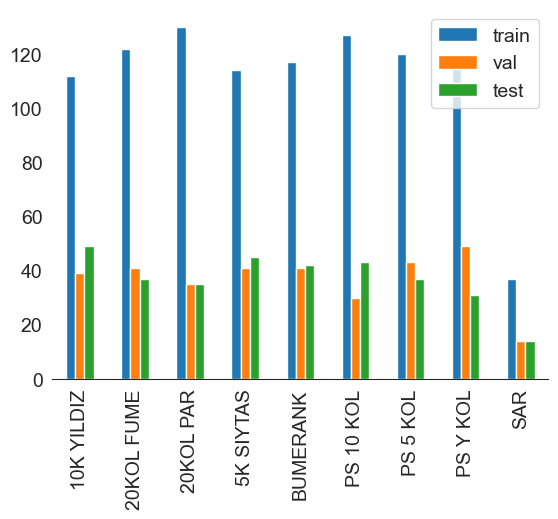

In [21]:
_, train_counts = np.unique(train_df["Label"], return_counts=True) # sum(train_df["label"], [])
_, val_counts = np.unique(val_df["Label"], return_counts=True) # sum(val_df["label"], [])
_, test_counts = np.unique(test_df["Label"], return_counts=True) # sum(test_df["label"], [])

# index=classes[1:] if you have background
pd.DataFrame({'train': train_counts,'val': val_counts, 'test': test_counts},index=classes).plot.bar()
plt.show()

In [22]:
val_dataset = CNN_Dataset(im_paths=val_df['Filepath'], labels=val_df['Label'], im_size=img_size, transform=None)
test_dataset = CNN_Dataset(im_paths=test_df['Filepath'], labels=test_df['Label'], im_size=img_size, transform=None)

# **13. Data Augmentation Of Training Data**

In [23]:
import albumentations as A  

def get_transform():  
    return A.Compose([  
        A.SomeOf([  
            A.Affine(always_apply=False, p=0.5),  
            A.Blur(always_apply=False, p=0.5, blur_limit=(1, 2)),  
            # A.ColorJitter(always_apply=False, p=0.5, brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2),   
            A.RandomBrightnessContrast(always_apply=False, p=1.0, brightness_limit=(-0.2, 0.5), contrast_limit=(-0.2, 0.5), brightness_by_max=True),  
            A.ToSepia(always_apply=False, p=0.5)  
        ], 1, replace=False, p=1) 
    ])  

In [24]:
train_dataset = CNN_Dataset(im_paths=train_df['Filepath'], labels=train_df['Label'], im_size=img_size, transform=get_transform())

# **14. Defining Data Loaders**

In [25]:
import multiprocessing

num_cores = multiprocessing.cpu_count()
print("Number of CPU cores:", num_cores)
print("You can set num_workers parameter half of your cores")

Number of CPU cores: 24
You can set num_workers parameter half of your cores


In [26]:
# Remove "num_workers" on Jupyter Notebook if "RuntimeError: DataLoader worker (pid(s) 16948, 16576, 7392, 7812) exited unexpectedly" 
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=0, pin_memory=True) 
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=0, pin_memory=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=0, pin_memory=True)
# Num Workers: By default, the DataLoader class sets the num_workers parameter to 0, which means the data loading is performed in the main process. If you have a multi-core CPU, you can set num_workers to a higher value (e.g., the number of CPU cores) to load the data in parallel. This can significantly speed up data loading, especially if loading and preprocessing the images take a significant amount of time.
# Pin Memory: If you're training on a GPU, you can set the pin_memory parameter to True in the data loaders. This enables the data to be directly transferred to the GPU memory, which can further speed up the training process.


# **15. Confirm Images Loading Correctly**

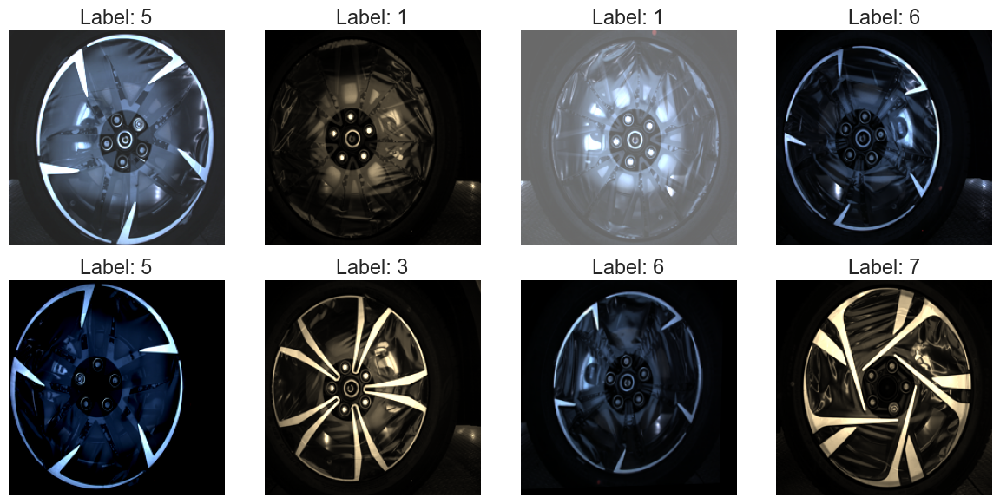

In [27]:
import matplotlib.pyplot as plt

# Function to display images
def show_images(images, labels):
    fig, axes = plt.subplots(figsize=(12, 6), nrows=2, ncols=4)
    for i, ax in enumerate(axes.flatten()):
        image = images[i].permute(1, 2, 0)  # Transpose (C, H, W) to (H, W, C)
        label = labels[i]
        ax.imshow(image)
        ax.set_title(f"Label: {label}")
        ax.axis("off")
    plt.tight_layout()
    plt.show()

# Load a batch of images from the train loader
images, labels = next(iter(train_loader))

# Display the images
show_images(images, labels)

# **16. Defining The Model**

In [28]:
model = torchvision.models.vgg16(pretrained=True)

# # Freeze all layers
# def freeze_layers(model):
#     for param in model.parameters():
#         param.requires_grad = False
# freeze_layers(model)

# # Unfreeze all layers
# def unfreeze_layers(model):
#     for param in model.parameters():
#         param.requires_grad = True
# unfreeze_layers(model)

def unfreeze_last_layers(model, num_layers):
    # Count the total number of layers in the model
    total_layers = len(model.features) + len(model.classifier)
    
    # Calculate the starting index of the last layers to unfreeze
    start_index = total_layers - num_layers
    
    # Set requires_grad=True for the parameters of the last layers
    for index, param in enumerate(model.parameters()):
        if index >= start_index:
            param.requires_grad = True
        else:
            param.requires_grad = False
unfreeze_last_layers(model, 5)

model.classifier[6] = torch.nn.Linear(4096, len(classes))

In [29]:
criterion = torch.nn.CrossEntropyLoss() # Define loss function 
optimizer = torch.optim.Adam(model.parameters(), lr=0.001) # Define optimizer & adjust lr according to your needs 
#optimizer = torch.optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5, verbose=True) 

# **16. GPU & CPU Settings**

In [30]:
# If GPU is available, set device to GPU 
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu') 
#If there are more than one GPUs, use specific GPUs: 
# model = torch.nn.DataParallel(model, device_ids=[0,1,2,3]) #Remove this line if not necessary. 
# move model to the right device 
model.to(device)

#  If you have access to a GPU, make sure to move your model and data onto the GPU to leverage its computational power. You can do this by calling model.to(device) and data.to(device) before training

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

# **17. Training The Model**

In [31]:
import time

In [32]:
start_time = time.time()  # Get the current time

num_epochs = 5  # Adjust the number of epochs as needed

train_loss_values, train_acc_values, val_loss_values, val_acc_values = [], [], [], []

best_val_loss = float('inf')

for epoch in range(num_epochs):
    model.train()  # Set the model to training mode
    
    train_loss = 0.0
    train_correct = 0
    train_total = 0
    
    for inputs, labels in train_loader:
        inputs,labels = inputs.to(device),labels.to(device) # OR "inputs, labels = inputs.cuda(), labels.cuda()"
        outputs = model(inputs)  # Forward pass
        loss = criterion(outputs, labels)  # Calculate loss
        _, predicted = torch.max(outputs.data, 1)
        train_total += labels.size(0)
        train_correct += (predicted == labels).sum().item() # OneHotEncoder: (predicted == torch.max(labels, 1)[1]).sum().item() | LabelEncoder: (predicted == labels).sum().item() 
        train_loss += loss.item()
        
        optimizer.zero_grad()  # Optimization
        loss.backward()  # Backward propagation and optimization
        optimizer.step()  # Updating parameters
    
    train_accuracy = train_correct / train_total
    train_loss /= len(train_loader)
    train_loss_values.append(train_loss)
    train_acc_values.append(train_accuracy)
    
    model.eval()  # Set the model to evaluation mode
    
    with torch.no_grad():
        val_loss = 0.0
        val_correct = 0
        val_total = 0
        
        for inputs, labels in val_loader:
            inputs,labels = inputs.to(device),labels.to(device) # OR "inputs, labels = inputs.cuda(), labels.cuda()"
            outputs = model(inputs)
            _, predicted = torch.max(outputs.data, 1)
            val_total += labels.size(0)
            val_correct += (predicted == labels).sum().item() # OneHotEncoder: (predicted == torch.max(labels, 1)[1]).sum().item() | LabelEncoder: (predicted == labels).sum().item()
            val_loss += criterion(outputs, labels).item()
        
        val_accuracy = val_correct / val_total
        val_loss /= len(val_loader)
        val_loss_values.append(val_loss)
        val_acc_values.append(val_accuracy)
        
        scheduler.step(val_loss)  # Update the learning rate based on validation loss
        
        # Save the best model weights based on validation loss
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            torch.save(model.state_dict(), 'best_model.pth')
            print(f"val_loss reduced to {best_val_loss:.4f}. Saving model...")
    
    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}, Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.4f}")
    
end_time = time.time()  # Get the current time again
execution_time = end_time - start_time  # Calculate the execution time

print(f"Execution time: {execution_time} seconds")
# 5 epochs & 32_batch opt_SGD - Train Loss: 0.0982, Train Accuracy: 0.9895, Val Loss: 0.0271, Val Accuracy: 1.0000 | 309 seconds
# 5 epochs & 32_batch opt_SGD - Train Loss: 0.1001, Train Accuracy: 0.9857, Val Loss: 0.0302, Val Accuracy: 1.0000 | 313 seconds
# 5 epochs & 32_batch opt_SGD - Train Loss: 0.0999, Train Accuracy: 0.9857, Val Loss: 0.0279, Val Accuracy: 1.0000 | 309 seconds
# 5 epochs & 32_batch opt_SGD - Train Loss: 0.0965, Train Accuracy: 0.9880, Val Loss: 0.0276, Val Accuracy: 1.0000 | 312 seconds
# 5 epochs & 32_batch opt_SGD - Train Loss: 0.0982, Train Accuracy: 0.9850, Val Loss: 1.6194, Val Accuracy: 0.7605 | 308 seconds
# 5 epochs & 32_batch opt_Adam - Train Loss: 0.0429, Train Accuracy: 0.9932, Val Loss: 0.0105, Val Accuracy: 1.0000 | 342 seconds
# 5 epochs & 32_batch opt_Adam - Train Loss: 0.0480, Train Accuracy: 0.9920, Val Loss: 0.0159, Val Accuracy: 1.0000 | 290 seconds

val_loss reduced to 0.1263. Saving model...
Epoch [1/5], Train Loss: 0.7579, Train Accuracy: 0.7688, Val Loss: 0.1263, Val Accuracy: 1.0000
val_loss reduced to 0.0482. Saving model...
Epoch [2/5], Train Loss: 0.1338, Train Accuracy: 0.9780, Val Loss: 0.0482, Val Accuracy: 1.0000
val_loss reduced to 0.0308. Saving model...
Epoch [3/5], Train Loss: 0.0796, Train Accuracy: 0.9930, Val Loss: 0.0308, Val Accuracy: 1.0000
val_loss reduced to 0.0215. Saving model...
Epoch [4/5], Train Loss: 0.0584, Train Accuracy: 0.9940, Val Loss: 0.0215, Val Accuracy: 1.0000
val_loss reduced to 0.0159. Saving model...
Epoch [5/5], Train Loss: 0.0480, Train Accuracy: 0.9920, Val Loss: 0.0159, Val Accuracy: 1.0000
Execution time: 290.09190607070923 seconds


# **18. Evaluate Model's Performance**

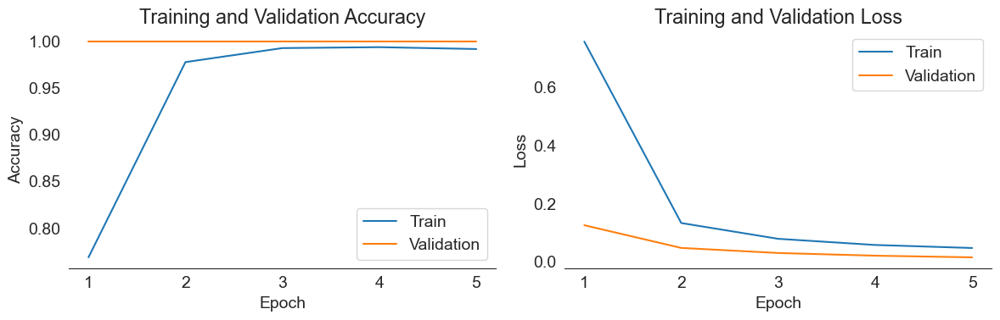

In [33]:
fig, ax = plt.subplots(1, 2, figsize=(12, 4))
# Accuracy plot
ax[0].plot(range(1, len(train_acc_values) + 1), train_acc_values, label='Train')
ax[0].plot(range(1, len(val_acc_values) + 1), val_acc_values, label='Validation')
ax[0].set(xlabel='Epoch', ylabel='Accuracy', title='Training and Validation Accuracy')
ax[0].legend()
# Loss plot
ax[1].plot(range(1, len(train_loss_values) + 1), train_loss_values, label='Train')
ax[1].plot(range(1, len(val_loss_values) + 1), val_loss_values, label='Validation')
ax[1].set(xlabel='Epoch', ylabel='Loss', title='Training and Validation Loss')
ax[1].legend()
plt.tight_layout()
plt.show()

In [ ]:
model = torchvision.models.vgg16(pretrained=True)
model.classifier[6] = torch.nn.Linear(4096, len(classes))
model.load_state_dict(torch.load('best_model.pth')) # Load best model weights
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
model.eval() # Set the model to evaluation mode

In [34]:
y_pred = []

with torch.no_grad():
    for images, _ in test_loader:
        images = images.to(device)
        outputs = model(images)
        _, batch_predictions = torch.max(outputs, 1)
        y_pred.extend(batch_predictions.cpu().numpy().tolist())

In [35]:
import sklearn
accuracy = sklearn.metrics.accuracy_score(test_df['Label'].values, y_pred)
print(f"Accuracy is {accuracy}")

Accuracy is 1.0


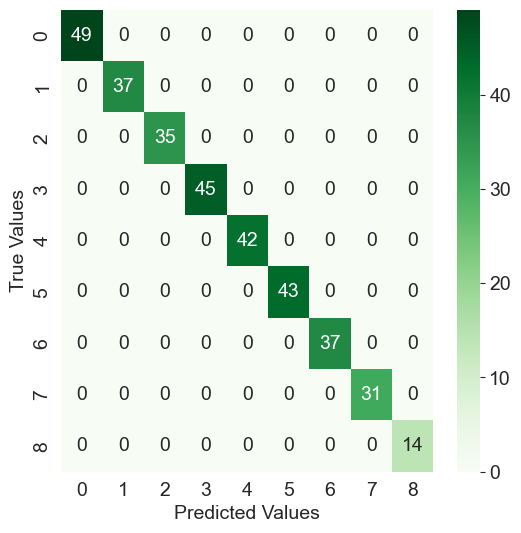

In [36]:
cm = sklearn.metrics.confusion_matrix(test_df['Label'].values, y_pred)
plt.figure(figsize=(6,6))
sns.heatmap(cm,annot=True, cmap='Greens', linecolor='gray', fmt='.0f')
plt.xlabel('Predicted Values')
plt.ylabel('True Values')
plt.show()

In [38]:
y_pred_decoded = [classes[pred] for pred in y_pred]

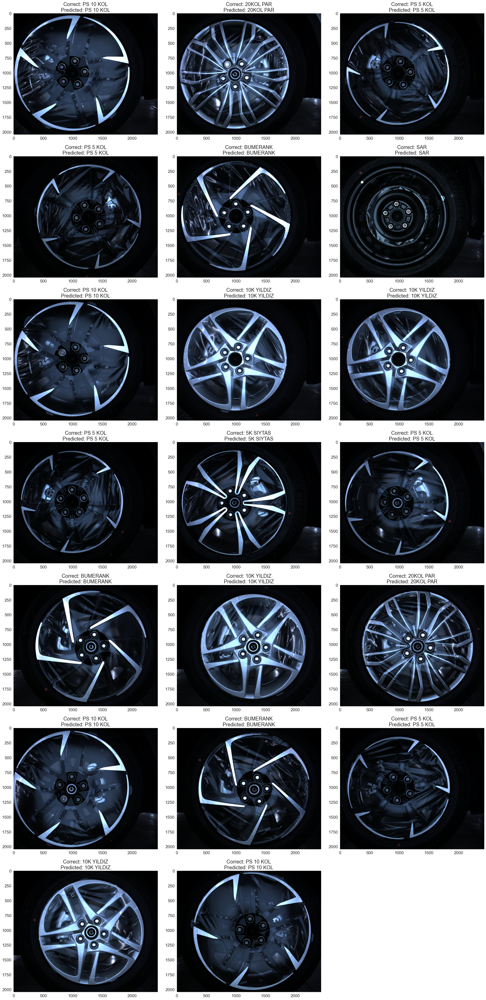

In [39]:
def plot_predictions(image_paths, correct_labels, predicted_labels, num_samples=10, num_cols=4, plot_gap=5):
    """This function plots images along with their corresponding correct and predicted labels.
    image_paths (list): List of image paths.
    correct_labels (list): List of correct labels.
    predicted_labels (list): List of predicted labels.
    num_samples (int, optional): Number of samples to plot.
    num_cols (int, optional): Number of columns in the plot grid. 
    plot_gap (int, optional): Vertical gap between rows in the plot.
    """
    samples = random.sample(range(len(image_paths)),num_samples) if num_samples !=0 else range(len(image_paths)) # Take required number of samples
    image_paths = [path for path in image_paths]
    correct_labels = [label for label in correct_labels]
    predicted_labels = [label for label in predicted_labels]
    
    image_paths = [image_paths[i] for i in samples] if num_samples !=0 else image_paths
    correct_labels = [correct_labels[i] for i in samples] if num_samples !=0 else correct_labels
    predicted_labels = [predicted_labels[i] for i in samples] if num_samples !=0 else predicted_labels
    
    plt.figure(figsize=(23,len(samples)/num_cols*plot_gap))

    for i in range(len(samples)):
        image_path = image_paths[i]
        correct_label = correct_labels[i]
        predicted_label = predicted_labels[i]

        # Load image using PIL
        image = Image.open(image_path)
        
        plt.subplot(int(len(samples)/num_cols)+1,num_cols,i+1)
        plt.title(f"Correct: {correct_label}\nPredicted: {predicted_label}")
        plt.imshow(image)
    plt.tight_layout()
    plt.show()

plot_predictions(image_paths=test_df['Filepath'], correct_labels=le.inverse_transform(test_df['Label'].values), predicted_labels=y_pred_decoded, num_samples=20, num_cols=3, plot_gap=7)

# **19. Inference**

In [40]:
model = torchvision.models.vgg16(pretrained=True)
model.classifier[6] = torch.nn.Linear(4096, len(classes))
model.load_state_dict(torch.load('best_model.pth')) # Load best model weights
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
model.eval() # Set the model to evaluation mode

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [41]:
# Assuming you have a single input image
image = Image.open('./TMMT Old Discwheel Datasets/BUMERANK/40682_STD_BUMERANK_5PARYOK - PRED_BUMERANK_5PARYOK 3.bmp')
image = image.resize((224, 224))  # Resize the image to the same size as during training
image = torchvision.transforms.ToTensor()(image)  # Convert image to tensor

# Move the input tensor to the device
image = image.to(device)

# Perform inference
with torch.no_grad():
    output = model(image.unsqueeze(0))  # Unsqueeze to add a batch dimension if needed
    predicted_label = output.argmax(dim=1).item()  # Assuming the output is logits, get the predicted label

# Convert the predicted label to a class name or any desired format
predicted_class = classes[predicted_label]

# Print the predicted class
print("Predicted class:", predicted_class)

Predicted class: BUMERANK
